# Tratamiento de imágenes - 2024 - Entregable 2

# Fecha de entrega: 19/05/2024

### Importante:   
En todos los ejercicios se espera que se entregue comentarios sobre decisiones tomadas en la implementación así como un análisis de los resultados. Estos comentarios y análisis se pueden entregar en celdas de texto agregadas a los notebooks o en un informe aparte.

Para la entrega se sube un **zip** (no rar, ni otro formato) con:
* El notebook del entregable modificado. El notebook debe tener las celdas ejecutadas con las salidas correspondientes. Debe tener todo lo necesario para poder ser ejecutado nuevamente
* Todo el resto del contenido del zip del entregable. Si, para mostrar resultados, usan en el notebook imágenes propias, deben incluirlas en la carpeta **imagenes**  del zip. 
* El informe en pdf en caso de no incluir las discusiones dentro del notebook en celdas "Markdown", o si les resulta más sencillo realizar el análisis en un documento aparte.

No se deben incluir en el zip de la entrega las imágenes de prueba que están disponibles en la página web del curso. Se asumirá que esas imágenes están en un directorio y se hará referencia a dichas imágenes en forma relativa a ese directorio (ver la celda siguiente).

In [11]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imsave
from math import radians
import cv2
from scipy.fftpack import fft2, ifft2, fftshift
from scipy.ndimage import binary_fill_holes
from skimage.morphology import erosion, dilation
from cv2 import dilate, erode, getStructuringElement


# FORMAS DE VER LAS GRAFICAS --------------------
# ELEGIR UNA DE LAS OPCIONES Y DES-COMENTAR (sacar # de la linea)
# ----------------
# a) graficas en línea  entre las celdas (no interactivo)
%matplotlib inline
# ---------------- 
# b) graficas en línea  entre las celdas (interactivo)
# %matplotlib notebook
# ----------------
# c) graficas en ventanas externas (abre una ventana por cada figura)
# %matplotlib
# ----------------
# d) Si se usa "jupyter lab" en lugar de "jupyter notebook" usar %matplotlib widget en lugar de %matplotlib notebook 
# requiere instalar el modulo "ipympl". Ver https://stackoverflow.com/questions/51922480/javascript-error-ipython-is-not-defined-in-jupyterlab#56416229
# %matplotlib widget
#---------------------------------------------------



# Directorio con la base de imágenes de prueba (las que están en la web de Timag)
# Ej. si usan la imagen trapo.jpg en el notebook no tienen que subirla al eva
# La llaman en el notebook en forma relativa a donde tengan esas imagenes:
# 
# filename = os.path.join(dir_base_imagenes, 'trapo.jpg')
# I = imread(filename)
dir_base_imagenes = '../base_imagenes'


## Transformaciones geométricas

### 1. Implementar una función que realice transformaciones proyectivas

Ej. function J=transformar(I, MatrizTransformación, TipoInterpolacion)  
donde MatrizTransformación es una matriz 3x3 y TipoInterpolacion puede ser 'bilineal' o 'vecino'

In [2]:

# Devuelve el nivel de gris interpolado correspondiente al punto
# punto = (fila,columna)  
# Si el punto está fuera de la imagen devuelve el valor "color_de_fondo"
from math import floor, ceil


def bilineal(I, punto, color_de_fondo):
    """
    Dado un punto de coordenadas no necesariamente enteras y una imagen I, 
    retorna la interpolación bilineal entre los cuatro pixeles de I más cercanos
    al punto de entrada."""
    
    x = punto[0]
    y = punto[1]
    alto, ancho = I.shape
    
    # Me fijo si cae fuera de la imagen
    if (x > ancho-1) or (x<0) or (y > alto-1) or (y<0):
        valor_interpolado = color_de_fondo
    
    else:
        #calculo las coordenadas de los puntos mas cercanos
        #             f1
        #   [y1,x1]---.---[y1,x2]
        #    |        |        |
        #    |      punto      |
        #    |      [y,x]      |
        #    |        |        |
        #   [y2,x1]---.---[y2, x2]
        #            f2
        
        y1 = floor(y)
        y2 = ceil(y)
        x1 = floor(x)
        x2 = ceil(x)
        
        # calculo valores originales
        pixel11= I[y1, x1]
        pixel12= I[y1, x2]
        pixel21= I[y2, x1]
        pixel22= I[y2, x2] 
        
        # calculo distancias
        dx1 = x - x1
        dx2 = 1 - dx1
        
        dy1 = y - y1
        dy2 = 1 - dy1
        
        
        # Interpolacion en x 
        f1 =  dx2 * pixel11 + dx1 * pixel12 
        f2 =  dx2 * pixel21 + dx1 * pixel22
         
        # interpolacion en y
        valor_interpolado = dy2 * f1 + dy1 * f2
       
    
    return valor_interpolado


# Devuelve el nivel de gris interpolado correspondiente al punto
# punto = (fila,columna)  
# Si el punto está fuera de la imagen devuelve el valor "color_de_fondo"
def vecino(img, punto, color_de_fondo):
    x = punto[0]
    y = punto[1]
    alto, ancho = img.shape
    
    # Me fijo si cae fuera de la imagen
    if (x > ancho-1) or (x<0) or (y > alto-1) or (y<0):
        valor_interpolado = color_de_fondo
        
    else:
        # Redondeo las coordenadas a enteros más cercanos.
        valor_interpolado = img[round(y), round(x)]
        
    return valor_interpolado


def transformar(img, T, tipo_interpolacion='vecino', color_de_fondo=0):
    #implementar
    
    assert (tipo_interpolacion=='vecino') or (tipo_interpolacion=='bilineal'), "los unicos valores aceptados para tipo_interpolacion son 'vecino' e 'interpolacion'"
    
    alto, ancho =img.shape
    img_transformada = np.zeros_like(img)
    
    T_inversa = np.linalg.inv(T)
    
    
    for h in range(alto):
        for w in range(ancho):
            hw_coord_no_homo = [w, h, 1] # lo hago en este orden para que quede bien lo que le paso a la funcion 
            p = T_inversa @ hw_coord_no_homo 
            p_homo = [p[0]/p[2], p[1]/p[2]]
            
            if tipo_interpolacion=='vecino':
                img_transformada[h,w] = vecino(img, p_homo, color_de_fondo)
                
            elif tipo_interpolacion=='bilineal':
                img_transformada[h,w] = bilineal(img, p_homo, color_de_fondo)

    return img_transformada

### 2. Usando la función transformar, mostrar ejemplos de transformaciones isométricas, afines y proyectivas  con diferentes interpolaciones

Parecido a lo que se muestra en estos ejemplos de scikit-image:  
https://scikit-image.org/docs/stable/auto_examples/transform/plot_transform_types.html


#### Mostrar una rotación con origen en vértice superior izquierdo de la imagen (origen de coordenadas) 

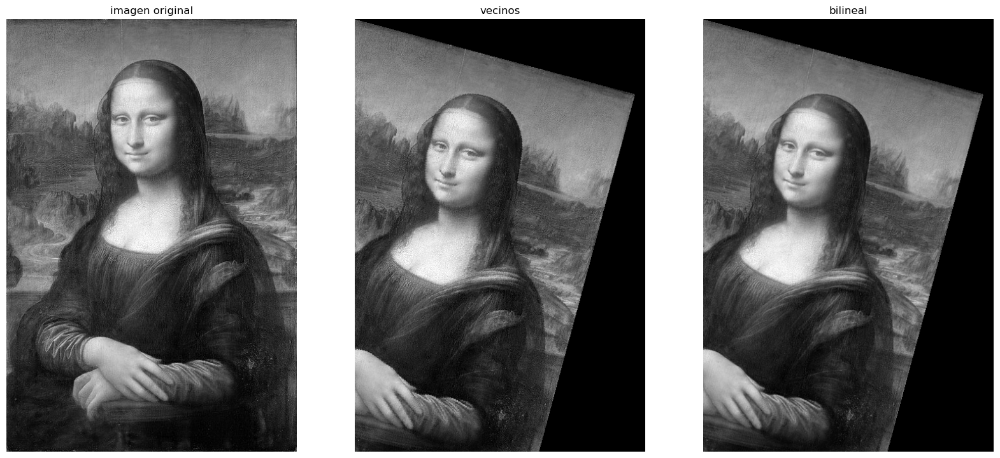

In [8]:
from math import radians

tita = radians(15)
ty = 0
tx = 0
matriz = np.array([[np.cos(tita), -np.sin(tita),  tx], 
                  [ np.sin(tita),  np.cos(tita),  ty],
                  [  0,               0,           1]])

I = imread(f'imagenes/monalisa.jpg')
if I.ndim>2:
    I = I[:,:,0]
    
imagen_transformada_vecinos = transformar(I, matriz, 'vecino', 0)
imagen_transformada_bilineal = transformar(I, matriz, 'bilineal', 0)


fig, ax = plt.subplots(1, 3, figsize=(20,15))

ax[0].imshow(I, cmap='gray')
ax[1].imshow(imagen_transformada_vecinos, cmap='gray')
ax[2].imshow(imagen_transformada_bilineal, cmap='gray')


titles = ["imagen original", "vecinos", "bilineal"]
for i, a in enumerate(ax.ravel()):
    a.set_title(titles[i])
    a.axis("off")

La función "transformar" funciona como se espera. Se puede notar la diferencia entre las dos opciones de reconstrucción de píxeles. La reconstrucción por vecino más cercano es más simple pero tiene inconsistencias en algunos bordes haciendo que curvas queden 'escalonadas'. Por otro lado, la reconstrucción bilineal es más precisa y suaviza la imagen, obteniendo una representación mas fiel de la imagen original.

#### Mostrar una rotación con origen en el centro de la imagen
La transformación de rotación en el centro de la imagen puede calcularse como la composición de una traslación, una rotación y una traslación.  

1ra matriz de traslación: 
 [[   1.    -0.  -225. ]
 [   0.     1.  -335.5]
 [   0.     0.     1. ]]


matriz de rotacion: 
 [[-1.0000000e+00 -1.2246468e-16  0.0000000e+00]
 [ 1.2246468e-16 -1.0000000e+00  0.0000000e+00]
 [ 0.0000000e+00  0.0000000e+00  1.0000000e+00]]


2da matriz de traslación: 
 [[  1.   -0.  225. ]
 [  0.    1.  335.5]
 [  0.    0.    1. ]]


matriz resultado de la composicción de las 3 anteriores: 
 [[-1.0000000e+00 -1.2246468e-16  4.5000000e+02]
 [ 1.2246468e-16 -1.0000000e+00  6.7100000e+02]
 [ 0.0000000e+00  0.0000000e+00  1.0000000e+00]]


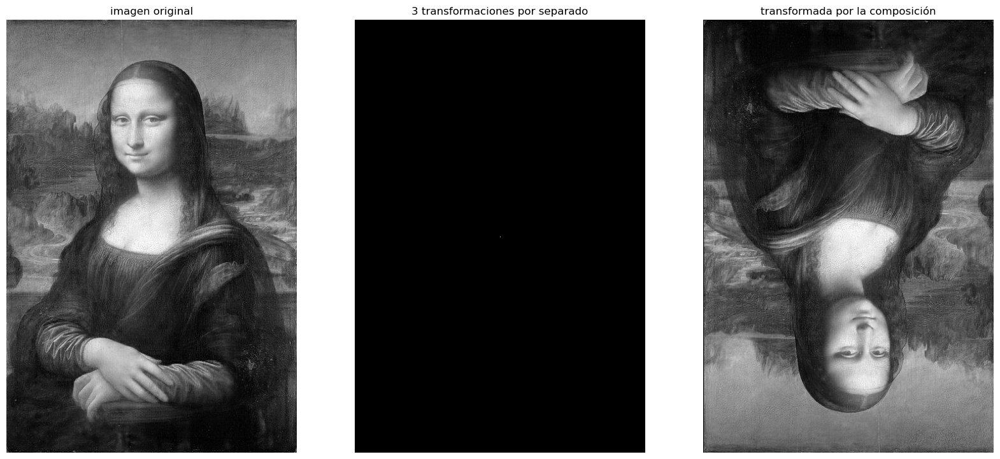

In [6]:
I = imread(f'imagenes/monalisa.jpg')
if I.ndim>2:
    I = I[:,:,0]
alto, ancho = I.shape

# Muestre las matrices correspondientes a las tres transformaciones 
tita = radians(0)
tx = -ancho/2
ty = -alto/2
traslacion1 = np.array([[np.cos(tita), -np.sin(tita),  tx], 
                 [np.sin(tita),   np.cos(tita),  ty],
                 [      0,             0,         1]])
print('1ra matriz de traslación: \n', traslacion1)

tita = radians(180)
rotacion = np.array([[ np.cos(tita), -np.sin(tita),    0], 
                [ np.sin(tita),  np.cos(tita),    0],
                [  0,               0,            1]])
print('\n\nmatriz de rotacion: \n', rotacion)


tita = radians(0)
tx = ancho/2
ty = alto/2
traslacion2 = np.array([[np.cos(tita), -np.sin(tita),  tx], 
                  [np.sin(tita),  np.cos(tita),  ty],
                  [      0,          0,          1]])
print('\n\n2da matriz de traslación: \n',traslacion2)


# Calcule la matriz de rotación en el centro como la composición de las tres transformaciones anteriores
composicion =  traslacion2 @ rotacion @ traslacion1
print('\n\nmatriz resultado de la composicción de las 3 anteriores: \n',composicion)
# lo que esta mas a la derecha es lo que se aplica primero
# T2 @ [M @ (T1 @ x)] = (T2 @ M @ T1) x



# Aplique la transformación y muestre el resultado
transf1 = transformar(I, traslacion1, 'vecino', 0)
transf2 = transformar(transf1, rotacion, 'vecino', 0)
transf3 = transformar(transf2, traslacion2, 'vecino', 0)

todojunto= transformar(I, composicion, 'vecino', 0)




fig, ax = plt.subplots(1, 3, figsize=(20,15))

ax[0].imshow(I, cmap='gray')
ax[1].imshow(transf3, cmap='gray')
ax[2].imshow(todojunto, cmap='gray')


titles = ["imagen original", "3 transformaciones por separado", "transformada por la composición"]
for i, a in enumerate(ax.ravel()):
    a.set_title(titles[i])
    a.axis("off")

Si queremos rotar desde el centro la imagen con los métodos ya implementados, primero tenemos que mover el centro de la imagen al (0,0), luego realizar la rotación y, por último, llevar nuevamente la imagen a su lugar original (deshacer la primera traslación). Pero como definimos un 'marco' del tamaño original de la imagen y todo lo que caiga fuera lo rellenamos con un color de fondo, si implementamos estas transformaciones por separado se puede observar como se pierde toda la información de la imagen. En cambio, si realizamos la composición de las 3 matrices, es como aplicar las transformaciones sucesivamente pero todas al mismo tiempo, logrando dar vuelta a la imagen desde el centro, como se puede observar más arriba. 

En este último caso hay que prestar especial cuidado al orden en en que se multiplican las matrices ya que 'lo que esta mas a la derecha es lo que se aplica primero' como se puede observar en el siguiente desarrollo:
$$T2 \cdot (R \cdot (T1 \cdot x)) = (T2 \cdot R \cdot T1) \cdot x$$


#### Mostrar una transformación afin 

el determinante de A es mayor a 0:  True


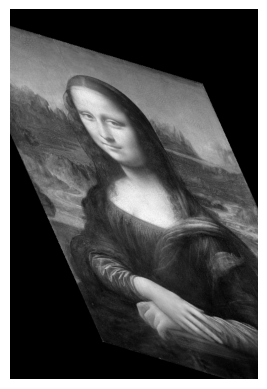

In [22]:
a11 = 1
a12 = 0.4
a21 = 0.3
a22 = 0.9
# chequeo que det(A)>0
print('el determinante de A es mayor a 0: ', a11*a22>a12*a21)

tx = -100
ty = 0
matriz = np.array([[a11, a12,  tx], 
                  [ a21,  a22, ty],
                  [  0,   0,   1]])


transformada = transformar(I, matriz, 'bilineal', 0)
plt.imshow(transformada, cmap='gray'), plt.axis('off')
plt.show()

#### Mostrar una transformación proyectiva

el determinante de A es distinto de 0:  True


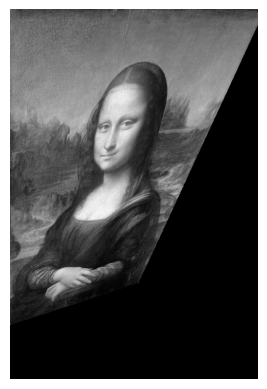

In [12]:
h11 = 0.7
h12 = 0
h13 = 0
h21 = 0
h22 = 1
h23 = 0
h31 = 0.0004
h32 = 0.001
h33 = 0.5

ty = 0
tx = 0
matriz = np.array([[h11, h12,  h13], 
                  [ h21,  h22, h23],
                  [ h31,  h32, h33]])


# chequeo que det(A) no sea 0
print('el determinante de A es distinto de 0: ', np.linalg.det(matriz)!=0)


transformada = transformar(I, matriz, 'bilineal', 0)
plt.imshow(transformada, cmap='gray'), plt.axis('off')
plt.show()

### 3. Implementar el cálculo de una matriz de transformación proyectiva a partir de un conjunto de  4 o más puntos correspondientes


In [9]:
def calcularHomografia(puntosA, puntosB):
    assert ((len(puntosA)>=4) and (len(puntosB)>=4)), 'se precisan al menos 4 puntos para calcular la homografía'
    assert (len(puntosA)==len(puntosB)), 'tiene que haber la misma cantidad de puntos en los parametros que recibe la funció'
    
    ecuaciones = []
    soluciones = []
    
    for a , b in zip(puntosA, puntosB):
        # r = h11 * x + h12 * y + h13 // s = h21 * x + h22 * y + h23 // t = h31 * x + h32 * y + 1 
        
        # x_prima = r/t 
        # x_prima * t = r 
        # x_prima * (h31 * x + h32 * y + 1 ) = h11 * x + h12 * y + h13
        # x_prima = h11 * x + h12 * y + h13 -  x_prima * (h31 * x + h32 * y)
        
        # y_prima = s/t 
        # y_prima * t = s
        # y_prima * (h31 * x + h32 * y + 1 ) = h21 * x + h22 * y + h23
        # y_prima = h21 * x + h22 * y + h23 -  y_prima * (h31 * x + h32 * y)
        
        # para cada par de puntos:
        # x_prima = h11 * x + h12 * y + h13 * 1 + h21 * 0 + h22 * 0 + h23 * 0 + h31 * (-x*x_prima) + h32 * (-y*x_prima)
        # y_prima = h11 * 0 + h12 * 0 + h13 * 0 + h21 * x + h22 * y + h23 * 1 + h31 * (-x*y_prima) + h32 * (-y*y_prima)
        
        x = a[0]
        y = a[1]
        
        x_prima = b[0]
        y_prima = b[1]
        
        ecuaciones.append([x, y, 1, 0, 0, 0, -x*x_prima, -y*x_prima])
        soluciones.append(x_prima)
        
        ecuaciones.append([0, 0, 0, x, y, 1, -x*y_prima, -y*y_prima])
        soluciones.append(y_prima)
    
    
    if len(puntosA)==4:
        coef = np.linalg.solve(ecuaciones, soluciones)
    else:
        coef= np.linalg.lstsq(ecuaciones, soluciones, rcond=None)[0]
        
    H = np.append(coef, 1).reshape((3,3))
        
    return H

La funcion implementada se basa en este despeje que, para cada par de puntos de origen y destino da 2 ecuaciones:

\begin{align*}
& \text{Tenemos:} \\
& r = h_{11} \cdot x + h_{12} \cdot y + h_{13} \\
& s = h_{21} \cdot x + h_{22} \cdot y + h_{23} \\
& t = h_{31} \cdot x + h_{32} \cdot y + 1 \\
\\
& x' = \frac{r}{t} \\
& y' = \frac{s}{t} \\
\\
& \text{Entonces:} \\
& x' \cdot t = r \\
& x' \cdot (h_{31} \cdot x + h_{32} \cdot y + 1 ) = h_{11} \cdot x + h_{12} \cdot y + h_{13} \\
& x' = h_{11} \cdot x + h_{12} \cdot y + h_{13} -  x' \cdot (h_{31} \cdot x + h_{32} \cdot y) \\
\\
& y' \cdot t = s \\
& y' \cdot (h_{31} \cdot x + h_{32} \cdot y + 1 ) = h_{21} \cdot x + h_{22} \cdot y + h_{23} \\
& y' = h_{21} \cdot x + h_{22} \cdot y + h_{23} -  y' \cdot (h_{31} \cdot x + h_{32} \cdot y) \\
\\
& \text{Para cada par de puntos:} \\
& x' = h_{11} \cdot x + h_{12} \cdot y + h_{13} \cdot 1 + h_{21} \cdot 0 + h_{22} \cdot 0 + h_{23} \cdot 0 + h_{31} \cdot (-x \cdot x') + h_{32} \cdot (-y \cdot x') \\
& y' = h_{11} \cdot 0 + h_{12} \cdot 0 + h_{13} \cdot 0 + h_{21} \cdot x + h_{22} \cdot y + h_{23} \cdot 1 + h_{31} \cdot (-x \cdot y') + h_{32} \cdot (-y \cdot y')
\end{align*}



#### Chequear la función implementada

In [24]:
# chequear la función calcularHomografía con un conjunto de puntos
origen = np.array([(0,0), (0,100), (100, 100), (100, 0)])
destino = np.array([(0,0), (0,100), (100, 50), (100, 0)])

# print(origen)
# print(destino)

# calcular la homografía
H = calcularHomografia(origen, destino)
print("H:")
print(H)

# aplicar a los puntos origen y verificar si el resultado son los puntos destino
origen_no_homogeneos = np.array([(i[0],i[1],1) for i in origen])
# print(origen_no_homogeneos)

transformados_homo = np.array([H @ punto for punto in origen_no_homogeneos])

transformados = np.array([(p[0]/p[2], p[1]/p[2]) for p in transformados_homo])
print("\ntransformados:")
print(transformados)

H:
[[2.   0.   0.  ]
 [0.   1.   0.  ]
 [0.01 0.   1.  ]]

transformados:
[[  0.   0.]
 [  0. 100.]
 [100.  50.]
 [100.   0.]]


In [25]:
# chequear la función calcularHomografía con un conjunto de puntos N>4
origen =  np.array([(0,0), (0,52), (0,100), (100, 100), (100, 0)])
destino = np.array([(0,0), (0,48), (0,100), (100, 50),  (100, 0)])
# print(origen)
# print(destino)


# calcular la homografía
H = calcularHomografia(origen, destino)
print("H:")
print(H)

# aplicar a los puntos origen y verificar si el resultado son los puntos destino

origen_no_homogeneos = np.array([(i[0],i[1],1) for i in origen])
# print(origen_no_homogeneos)

transformados_homo = np.array([H @ punto for punto in origen_no_homogeneos])

transformados = np.array([(round(p[0]/p[2], 2), round(p[1]/p[2], 2)) for p in transformados_homo])
print("\ntransformados:")
for p in transformados:
    print(f"[{p[0]:.2f}, {p[1]:.2f}]")

H:
[[ 1.96195441e+00 -1.20570096e-02  6.10888485e-01]
 [ 1.07071952e-02  9.74987284e-01 -1.07071952e+00]
 [ 9.74095018e-03 -2.41204495e-04  1.00000000e+00]]

transformados:
[0.61, -1.07]
[-0.02, 50.26]
[-0.61, 98.81]
[100.31, 50.00]
[99.69, 0.00]


El funcionamiento es bueno, si se pasa como parametros 4 pares de puntos se lleva correctamente los puntos de origen a destino y, si se pasan mas de 4 se hace la mejor estimacion de los coeficientes posibles para aproximar los puntos de origen lo maximo posible a los puntos de destino

#### Aplicación: Incrustar la imagen "monalisa" en la imagen "casa" de forma que parezca pintada en el techo de la cabaña
Los puntos del techo pueden seleccionarse manualmente.  
Notar que, una vez calculada la homografía, la imagen resultado puede generarse mediante una función prácticamente igual a la función transformar implementada en (1).

In [26]:
def imagen_sobre_otra(img_fondo, imagen_frente, T, tipo_interpolacion='vecino', alfa=0):
    """transforma una imagen y la coloca sobre otra, en los pixeles que no corresponden a ninguno a la imagen a transformar, se coloca la imagen de fondo
        en los que si corresponden se interpola el valor y se le suma alfa * imagen de fondo para que haya un suavizado entre las dos imagenes

    Args:
        img_fondo (_type_): imagen de fondo
        imagen_frente (_type_): imagen a transformar y a colocar sobre la otra
        T (_type_): Matriz de transformacion que se desea realizar sobre la imagen de frente
        tipo_interpolacion (str, optional): 'bilineal' o 'vecino'. Defaults to 'vecino'.
        alfa (int, optional): valor por el que su multiplican la imagen de fondo en los pixeles donde se pone la imagen encima. Defaults to 0.

    Returns:
        _type_: _description_
    """
    
    assert (tipo_interpolacion=='vecino') or (tipo_interpolacion=='bilineal'), "los unicos valores aceptados para tipo_interpolacion son 'vecino' e 'interpolacion'"
    
    alto_fondo, ancho_fondo = img_fondo.shape
    alto_frente, ancho_frente = imagen_frente.shape
    
    transformada = np.zeros_like(img_fondo).astype(np.uint16) #hago esto porque sino no se puede tomar mas valores que 255 (254 + 2 = 0)
    
    T_inversa = np.linalg.inv(T)
    
    # recorro la imagen de fondo
    for h in range(alto_fondo):
        for w in range(ancho_fondo):
            hw_coord_no_homo = [w, h, 1] 
            p = T_inversa @ hw_coord_no_homo 
            x = p[0]/p[2]
            y = p[1]/p[2]
            
            p_homo = [x, y]
            
            # si al hacer la inversa de la transformada caigo fuera de la imagen que quiero transformar y pegar, pongo solo la info de la imagen de fondo
            if (x > ancho_frente-1) or (x<0) or (y > alto_frente-1) or (y<0):
                transformada[h,w] = img_fondo[h,w]
            
            else:
                # si caigo dentro de la imagen, interpolo el valor correspondiente
                if tipo_interpolacion=='vecino':
                    valor_interpolado = vecino(imagen_frente, p_homo, 0)
                    
                elif tipo_interpolacion=='bilineal':
                    valor_interpolado = bilineal(imagen_frente, p_homo, 0)
                
                # hago un blend entre las imagenes 
                transformada[h,w] = img_fondo[h,w] * alfa + valor_interpolado


    # devuelvo la imagen al rango (0,255)
    max_val = np.max(transformada)
    transformada = transformada  / max_val * 255 
    
    return transformada.astype(np.uint8)



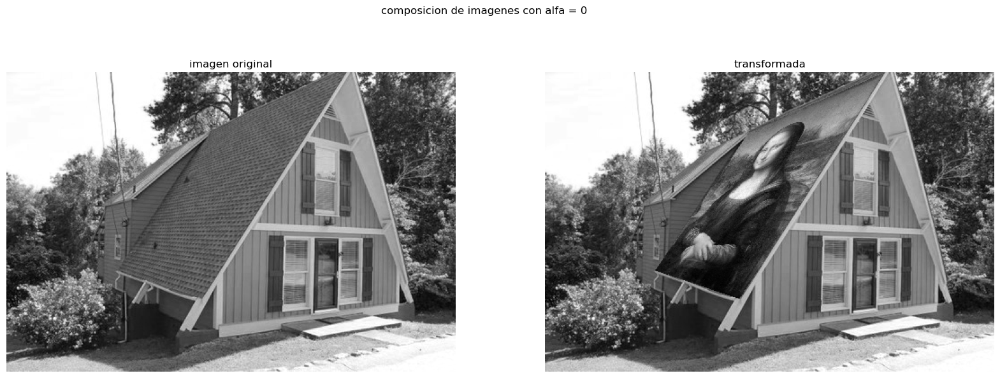

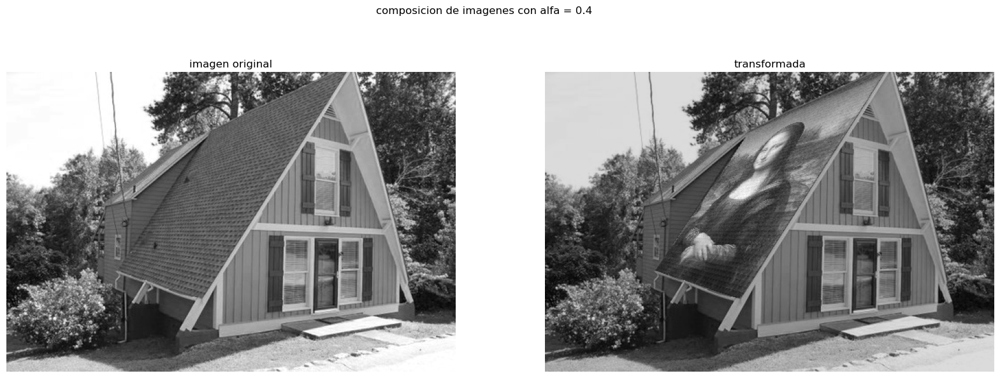

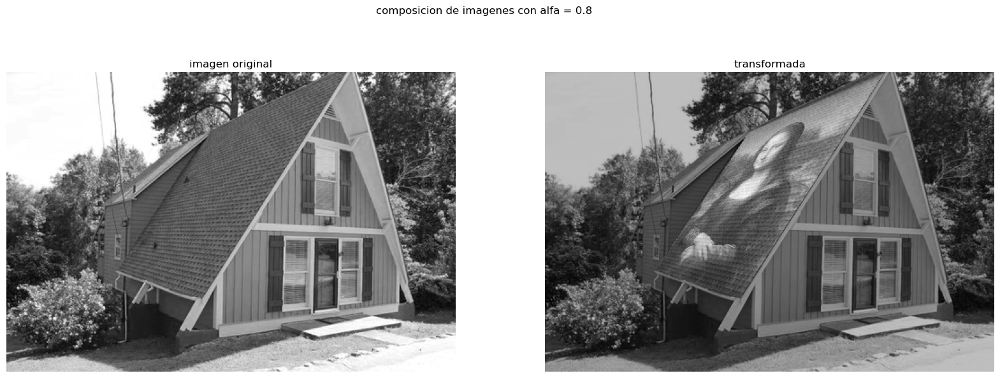

In [27]:
casa = imread(f'imagenes/casa.jpg')
if casa.ndim>2:
    casa = casa[:,:,0]
    
monalisa = imread(f'imagenes/monalisa.jpg')
if monalisa.ndim>2:
    monalisa = monalisa[:,:,0]


alto_ml, ancho_ml = monalisa.shape
origen  = [(0,0), (ancho_ml,0), (0,alto_ml), (ancho_ml,alto_ml)]
destino = [(227,66), (378,0), (122,221), (216,253)]

# # calcular la homografía
H = calcularHomografia(origen, destino)


# para distintos niveles de "transparencia" del techo, hago la superposición    
for alfa in [0, 0.4, 0.8]:
    # transformo y superpongo
    transformada = imagen_sobre_otra(casa, monalisa, H, alfa=alfa, tipo_interpolacion='bilineal')

    # muestro el resultado
    fig, ax = plt.subplots(1, 2, figsize=(20,7))
    ax[0].imshow(casa, cmap='gray')
    ax[1].imshow(transformada, cmap='gray')

    titles = ["imagen original", "transformada"]
    for i, a in enumerate(ax.ravel()):
        a.set_title(titles[i])
        a.axis("off")
    plt.suptitle(f"composicion de imagenes con alfa = {alfa}")

Se logra incrustar la monalisa en la el techo de la casa usando una funcion similar a transformar, me pareció interesante jugar con la 'transparencia' del techo de la imagen del fondo para lograr un mejor efecto y que parezca que la monalisa esta pintada en el techo de la cabaña y no se note tanto que son dos imagenes que se ponen una encima de la otra.

## Segmentación

### 4. Detección de líneas con la transformada de Hough

#### Implementar detección de líneas con la transformada de Hough.   
Se puede encontrar una buena explicación y pseudocódigo en los libros de [Burger & Burge](https://books.google.com.uy/books?id=YpzWCwAAQBAJ&printsec=frontcover#v=onepage&q&f=false). 

#### Dibujo de líneas

In [3]:
def plot_lineas_hough(fig, L, fondo):
      '''
      Parameters
      ----------
      fig : Numero de la figura de matplotlib donde se plotean las líneas
      L :   [[rho, theta, votos], [rho, theta, votos], .....]
            Lista de rectas detectadas con la función lineas_hough 

      Retorna
      -------
      Nada

      '''
      
      # Implementar
      alto, ancho = fondo.shape
      
      for linea in L:
            rho = linea[0]
            tita = linea[1]
            votos = linea[2]

            # obtengo las coordenadas cartesianas del punto de referencia a partir de las coordenadas polares
            x0 = ancho/2 + rho * np.cos(tita)
            y0 = alto/2 + rho * np.sin(tita) 
            #sumo ancho/2 y alto/2 porque mi centro de cordenadas es la mitad de la imagen

            #preciso, a partir de este punto recorrer la linea hacia un lado y otro para hayar los "extremos", me alcanza con que caigan fuera 
            # de la imagen que voy a plotear, la distancia maxima que puede tener una linea en este espacio de dimensiones d = raiz(alto**2 +ancho**)
            # me muevo sobre la linea haciendo x*cos(tita) y*sin(tita)
            d = np.sqrt(ancho**2 + alto**2)

            x1 = int(x0 + d/2 * np.cos(np.pi/2-tita))
            x2 = int(x0 - d/2 * np.cos(np.pi/2-tita))
            
            y1 = int(y0 - d/2 * np.sin(np.pi/2-tita))
            y2 = int(y0 + d/2 * np.sin(np.pi/2-tita))

            fig.plot([x1, x2], [y1, y2])
                  
            
            
      fig.imshow(fondo, cmap='gray')

#### Mostrar el funcionamiento de plot_lineas_hough para distintos valores theta-rho
Notar que se puede implementar y probar **plot_lineas_hough** antes de implementar **lineas_hough**.  
Se sugiere dejar andando correctamente **plot_lineas_hough** primero. Esto permitirá luego probar rápidamente los resultados de **lineas_hough**.
  

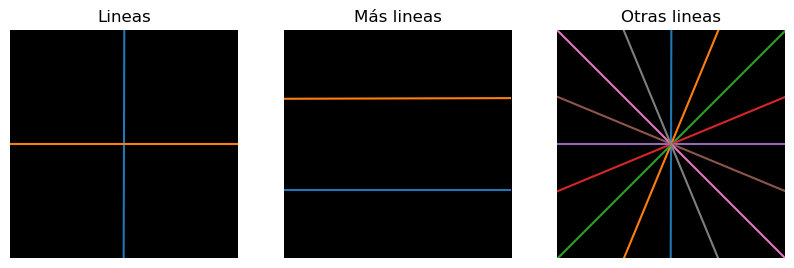

In [11]:
# Imagen vacía a plottear
fondo = np.zeros((250,250))

# líneas vertical y horizontal que pasan por la mitad de la imagen 
lineas = [[0,0,1], [0,np.pi/2,3]]    

# líneas horizontales con rho 50
lineas2 = [[50, np.pi/2, 1], [50, 3*np.pi/2 ,2]]

# lineas separadas por un ángulo de pi/8 radianes
lineas3 = [[0,0,5], [0,np.pi/8,1],
           
           [0,np.pi/4,8], [0,3*np.pi/8,6], 

           [0,np.pi/2,5], [0,5*np.pi/8,4],

           [0,3*np.pi/4,100], [0,7*np.pi/8,6]
           ] 


# Inicializar figura.
fig, ax = plt.subplots(1,3,figsize=(10,5))
# Plot lineas.
plot_lineas_hough(ax[0], lineas, fondo)
ax[0].set_title("Lineas") , ax[0].axis("off")
# Plot lineas2
plot_lineas_hough(ax[1], lineas2, fondo)
ax[1].set_title("Más lineas"), ax[1].axis("off")
# Plot lineas3
plot_lineas_hough(ax[2], lineas3, fondo)
ax[2].set_title("Otras lineas"), ax[2].axis("off")

plt.show()

#### Detección de líneas

In [4]:
def isLocalMax(A,i,j):
    """Me fijo si A[i,j] es máximo en un cuadrado de 3x3.
    """
    #busco el maximo en el cuadrado de 3x3
    max=0
    for x in range(i-1, i+2):
        for y in range(j-1,j+2):
            #el try and except es para los casos de los bordes.
            try:
                if A[x,y]>max:
                    max = A[x,y]
            except:
                pass
    #retorno true si el maximo es A[i,j]
    return(max<=A[i,j]) 


def lineas_hough(I, m, n, minimo_votos):
    '''
    Detección de líneas mediante la Transformada de Hough
    
    Parametros
    ----------
    I : imagen binaria (resultado de un detector de bordes por ejemplo)
    m, n : Enteros que determinan las dimensiones del acumulador
           m: cantidad de pasos en Theta
           n: cantidad de pasos en Rho
    minimo_votos : Cantidad mínima de votos que debe tener una recta 
    debug : Booleano opcional. En caso de ser verdadero, se muestra la imagen del acumulador
    
    Retorna
    -------
    L : [[rho, theta, votos], [rho, theta, votos], .....]
        Lista con las rectas detectadas donde cada elemento de la lista es una terna [rho, theta, votos]
        La lista está ordenada en forma decreciente en la cantidad de votos 

    '''
    L=[]
    
    #obtengo el tamaño de la imagen
    alto, ancho = I.shape[:2]
    xr = ancho/2
    yr = alto/2
    
    
    d_tita = np.pi / m
    d_r = np.sqrt(alto**2 + ancho**2) / n
    j0 = n // 2 #supongo que es la division entera a lo que se refiere en el pseudocodigo
    
    #inicializo el acumulador todo con ceros
    A = np.zeros((m,n))
    
    # recorro la imagen
    for h in range(alto):
        for w in range(ancho):
            # si el pixel es mayor a cero, lo tengo que agregar al acumulador
            if I[h,w]>0:
                x = w - xr
                y = h - yr
                # calculo que lugares del acumulador se corresponden al pixel que es mayor que cero y los aumento
                for i in range(m):
                    tita = d_tita * i
                    r = x * np.cos(tita) + y * np.sin(tita)
                    j =  j0 + round(r/d_r)
                    if j == n:
                        j=j-1
                        
                    A[i, j] += 1
                
                
    # para cada punto del acumulador, me fijo si supera al minimo de votos y si es maximmo local, 
    # si cumple esto lo agrego a la lista que devuelvo
    for i in range(m):
        for j in range(n):
            if (A[i,j]>=minimo_votos) and (isLocalMax(A,i,j)):
                tita = i * d_tita
                r = (j-j0) * d_r
                a = A[i,j]
                L.append([r, tita, a])
    
    return A, L

#### Mostrar el funcionamiento de lineas_hough
Para imágenes artificiales sencillas que se construirán,    
a) detectar líneas  
b) mostrar el acumulador y plotear las rectas    
c) relacionar el contenido del acumulador con las rectas correspondientes    

(Text(0.5, 1.0, 'Lineas'), (-0.5, 299.5, 199.5, -0.5))

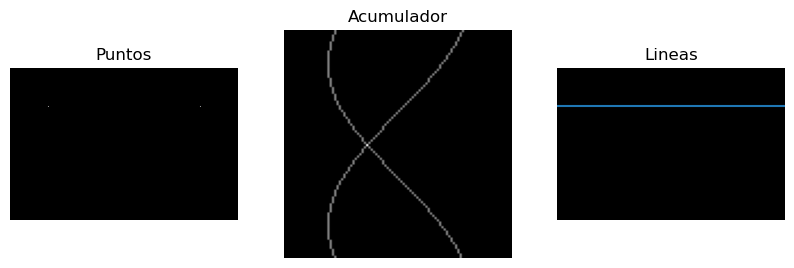

In [5]:
#Ejemplo 1 
I = np.zeros((200,300), dtype=np.uint8)
I[50,50]=255
I[50,250]=255


fondo = np.zeros((200,300))
A, L = lineas_hough(I, 100, 100, 2)


# Inicializar figura.
fig, ax = plt.subplots(1,3,figsize=(10,5))

ax[0].imshow(I, cmap ='gray')
ax[0].set_title("Puntos") , ax[0].axis("off")

# Acumulador
ax[1].imshow(A, cmap ='gray')
ax[1].set_title("Acumulador") , ax[1].axis("off")

# Plot lineas.
plot_lineas_hough(ax[2], L, fondo)
ax[2].set_title("Lineas") , ax[2].axis("off")



(Text(0.5, 1.0, 'Lineas'), (-0.5, 299.5, 199.5, -0.5))

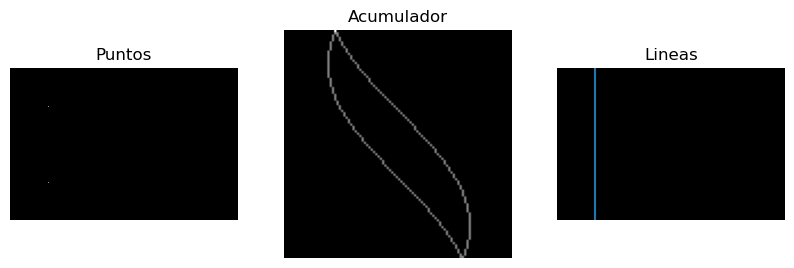

In [428]:
#Ejemplo 2
I = np.zeros((200,300), dtype=np.uint8)
I[50,50]=255
I[150,50]=255

fondo = np.zeros((200,300))
A, L = lineas_hough(I, 100, 100, 2)


# Inicializar figura.
fig, ax = plt.subplots(1,3,figsize=(10,5))

ax[0].imshow(I, cmap ='gray')
ax[0].set_title("Puntos") , ax[0].axis("off")

# Acumulador
ax[1].imshow(A, cmap ='gray')
ax[1].set_title("Acumulador") , ax[1].axis("off")

# Plot lineas.
plot_lineas_hough(ax[2], L, fondo)
ax[2].set_title("Lineas") , ax[2].axis("off")

(Text(0.5, 1.0, 'Lineas'), (-0.5, 299.5, 199.5, -0.5))

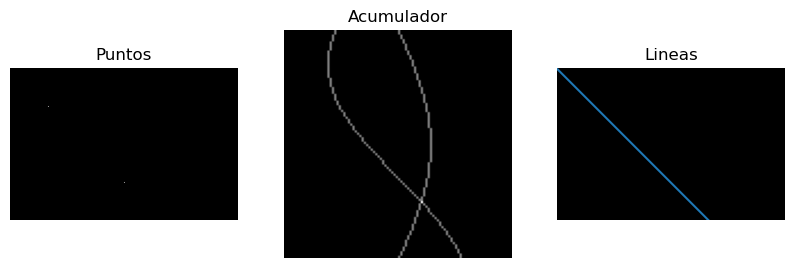

In [6]:
#Ejemplo 3
I = np.zeros((200,300), dtype=np.uint8)
I[50,50]=255
I[150,150]=255

fondo = np.zeros((200,300))
A, L = lineas_hough(I, 100, 100, 2)

# Inicializar figura.
fig, ax = plt.subplots(1,3,figsize=(10,5))

ax[0].imshow(I, cmap ='gray')
ax[0].set_title("Puntos") , ax[0].axis("off")

# Acumulador
ax[1].imshow(A, cmap ='gray')
ax[1].set_title("Acumulador") , ax[1].axis("off")

# Plot lineas.
plot_lineas_hough(ax[2], L, fondo)
ax[2].set_title("Lineas") , ax[2].axis("off")

(Text(0.5, 1.0, 'Lineas'), (-0.5, 299.5, 199.5, -0.5))

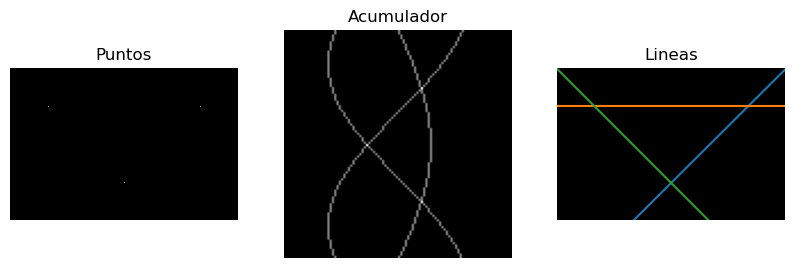

In [430]:
# Ejemplo 4
I = np.zeros((200,300), dtype=np.uint8)
I[50,50]=255
I[50,250]=255
I[150,150]=255

A, L = lineas_hough(I, 100, 100, 2)


# Inicializar figura.
fig, ax = plt.subplots(1,3,figsize=(10,5))

ax[0].imshow(I, cmap ='gray')
ax[0].set_title("Puntos") , ax[0].axis("off")

# Acumulador
ax[1].imshow(A, cmap ='gray')
ax[1].set_title("Acumulador") , ax[1].axis("off")

# Plot lineas.
plot_lineas_hough(ax[2], L, I)
ax[2].set_title("Lineas") , ax[2].axis("off")

#### Mostrar el funcionamiento de lineas_hough sobre la imagen trapecio.png
Comentar resultados al variar la resolución en el espacio de parámetros (m y n en la función lineas_hough)

264 434


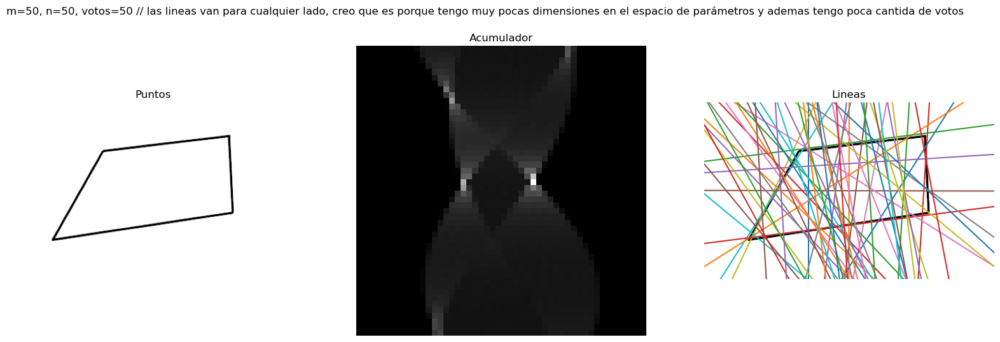

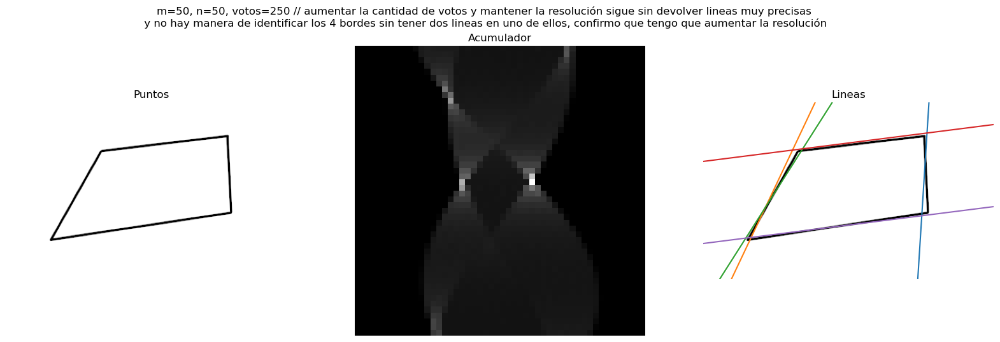

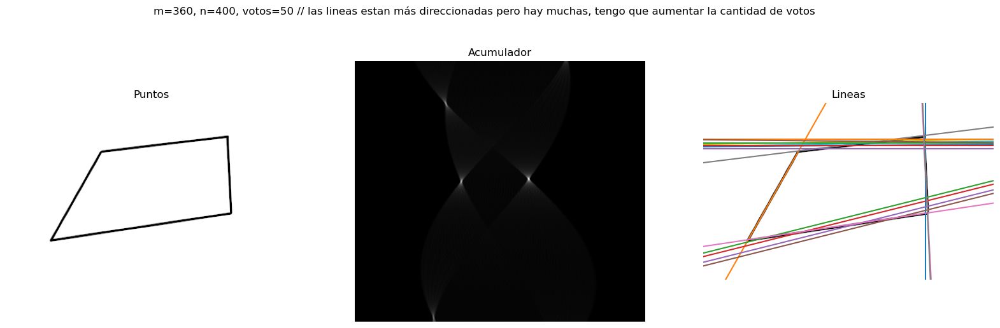

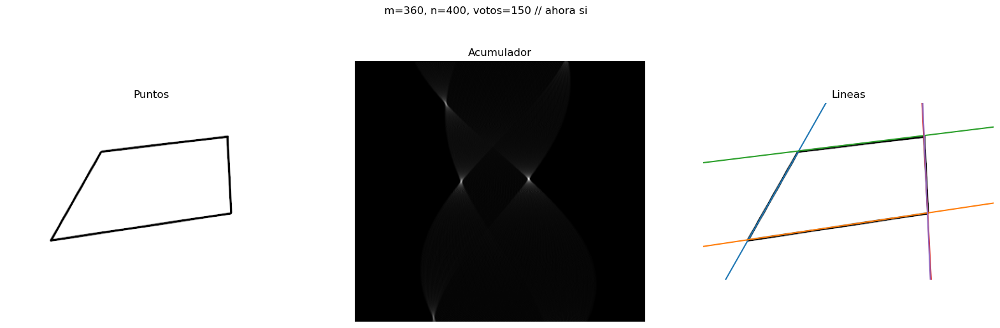

In [6]:
I = imread(f'imagenes/trapecio.png')
if I.ndim>2:
    I = I[:,:,0]
alto, ancho = I.shape
print(alto,ancho)
I_binaria = (I<125).astype(int)


# m: cantidad de pasos en Theta
# n: cantidad de pasos en Rho
ms = [50, 50, 360, 360]
ns = [50, 50, 400, 400]
votos = [50, 250, 50, 150]
titulos = ['m=50, n=50, votos=50 // las lineas van para cualquier lado, creo que es porque tengo muy pocas dimensiones en el espacio de parámetros y ademas tengo poca cantida de votos',
           'm=50, n=50, votos=250 // aumentar la cantidad de votos y mantener la resolución sigue sin devolver lineas muy precisas\n y no hay manera de identificar los 4 bordes sin tener dos lineas en uno de ellos, confirmo que tengo que aumentar la resolución\n',
           'm=360, n=400, votos=50 // las lineas estan más direccionadas pero hay muchas, tengo que aumentar la cantidad de votos',
           ' m=360, n=400, votos=150 // ahora si']


for i in range(4):
    A, L = lineas_hough(I_binaria, m=ms[i], n=ns[i], minimo_votos=votos[i])

    # Inicializar figura.
    fig, ax = plt.subplots(1,3,figsize=(20,6))

    ax[0].imshow(I, cmap ='gray')
    ax[0].set_title("Puntos") , ax[0].axis("off")

    # Acumulador
    ax[1].imshow(A, cmap ='gray')
    ax[1].set_title("Acumulador") , ax[1].axis("off")

    # Plot lineas.
    plot_lineas_hough(ax[2], L, I)
    ax[2].set_title("Lineas") , ax[2].axis("off")
    
    fig.suptitle(titulos[i])

### 5. Aplicación: Determinar en forma automática  la ubicación de un tablero de ajedrez
a) Detectar líneas   
b) Determinar la ubicación del tablero   
c) Rectificar la imagen del tablero. Obtener una imagen del tablero como visto desde arriba   

Mostrar resultados con todas las imágenes de tableros


In [7]:

def diferencia_angulos(angulo1, angulo2):
    # Calcula la diferencia absoluta entre los ángulos
    diferencia_absoluta = np.abs(angulo1 - angulo2)
    
    # Ajusta la diferencia para tener en cuenta la circularidad
    diferencia_ajustada = min(diferencia_absoluta, np.pi - diferencia_absoluta)
    
    return diferencia_ajustada


def hallar_interseccion(m1, n1, m2, n2, I):
    alto, ancho = I.shape
    x = (n1-n2)/(m2-m1)
    y = m1 * x + n1
    x = x + ancho/2
    y = y + alto/2
    return x, y
    
    
def determinar_lineas_exteriores(L, I, cte_de_separacion = np.pi/4):
    
    lista_ordenada = sorted(L, key=lambda x: x[1])
    titas = [item[1] for item in lista_ordenada]
    
    menor_tita = titas[0]
    
    direccion_1 = []
    direccion_2 = []
        
    #separar las lineas en las dos direcciones
    for i in range(len(titas)):
        tita_actual = lista_ordenada[i][1]

        if diferencia_angulos(tita_actual, menor_tita) < cte_de_separacion :
            #estan cerca, van en la misma dirección
            if (tita_actual < (np.pi - (np.pi/4) - menor_tita)):
                # si un angulo esta muy cerca de ser tita, tengo que 'dar vuelta' el rho y el angulo, porque sino no logro detectar bien los bordes
                direccion_1.append(lista_ordenada[i])
            else:
                direccion_1.append([-lista_ordenada[i][0], np.pi + lista_ordenada[i][1], lista_ordenada[i][2]] )
        else:
            # estan separados, van en la misma direccion
            direccion_2.append(lista_ordenada[i])
            
 
    dir_1_segun_rho = sorted(direccion_1, key=lambda x: x[0])
    titas1 = [x[1] for x in dir_1_segun_rho]
    rhos1 = [x[0] for x in dir_1_segun_rho]
    
    dir_2_segun_rho = sorted(direccion_2, key=lambda x: x[0])
    titas2 = [x[1] for x in dir_2_segun_rho]
    rhos2 = [x[0] for x in dir_2_segun_rho]
    
    m1, n1 =  -np.cos(titas1[0])/np.cos((np.pi/2)- titas1[0]),   rhos1[0]/np.cos((np.pi/2)- titas1[0])
    m2, n2 =  -np.cos(titas1[-1])/np.cos((np.pi/2)- titas1[-1]), rhos1[-1]/np.cos((np.pi/2)- titas1[-1])
    m3, n3 =  -np.cos(titas2[0])/np.cos((np.pi/2)- titas2[0]),   rhos2[0]/np.cos((np.pi/2)- titas2[0])
    m4, n4 =  -np.cos(titas2[-1])/np.cos((np.pi/2)- titas2[-1]), rhos2[-1]/np.cos((np.pi/2)- titas2[-1])
    
    puntoA = hallar_interseccion(m1, n1, m3, n3, I) 
    puntoB = hallar_interseccion(m1, n1, m4, n4, I)                
    puntoC = hallar_interseccion(m2, n2, m4, n4, I)
    puntoD = hallar_interseccion(m2, n2, m3, n3, I)  
    
    return puntoA, puntoB, puntoC, puntoD

In [8]:
def transformar_tablero(puntos, I, tamanio):
    # para saber que puntos de los extremos del tablero hacer corresponder a que puntos de la imagen transformada en un cuadrado
    # primero ordeno segun x
    puntos = sorted(puntos, key=lambda x: x[0])
    # despues, ordeno de a pares segun y 
    if puntos[0][1]>puntos[1][1]:
        puntos[0], puntos[1] = puntos[1], puntos[0]     
    if puntos[2][1]>puntos[3][1]:
        puntos[2], puntos[3] = puntos[3], puntos[2]    
    
    # defino el destino siendo coherente con lo de arriba
    destino = [[0,0], [0, tamanio], [tamanio, 0], [tamanio, tamanio]]
    
    # calculo la homografía y transformo
    H = calcularHomografia(puntos, destino)
    transformada = transformar(I, H, 'bilineal')
    transformada = transformada[:tamanio, :tamanio]
    
    return transformada

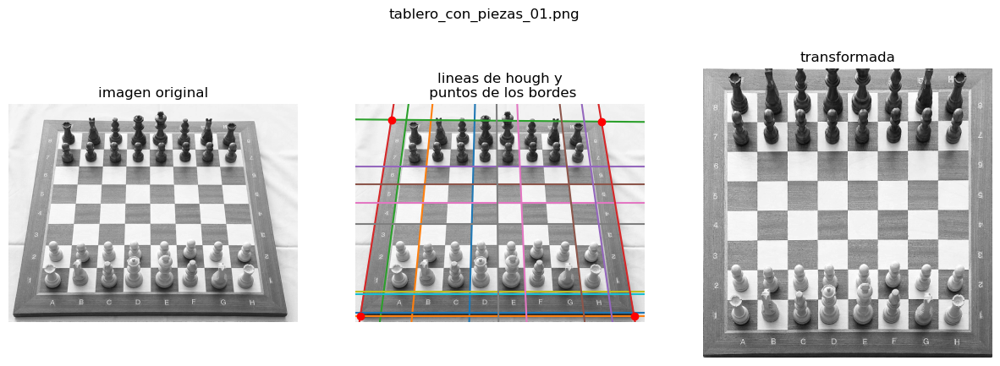

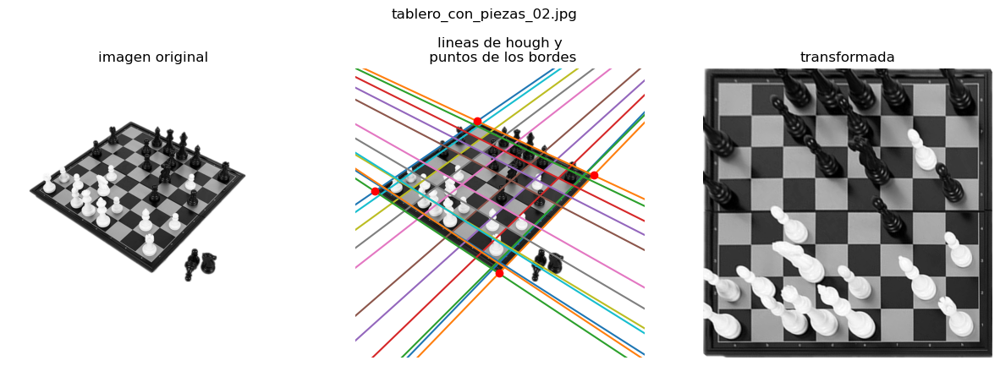

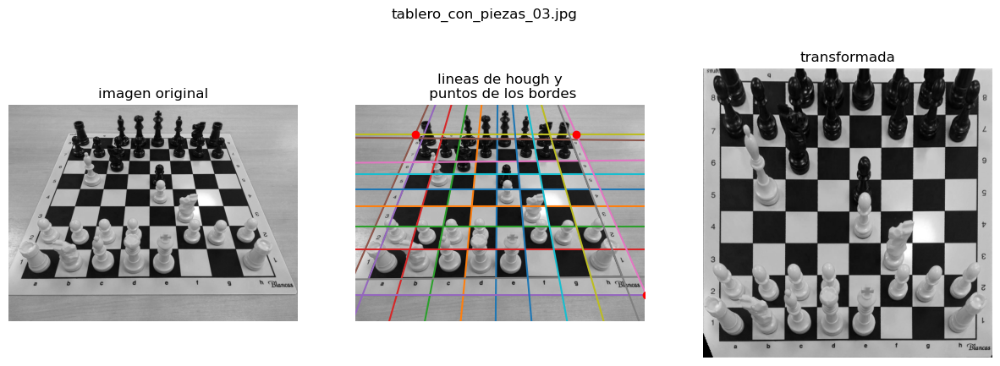

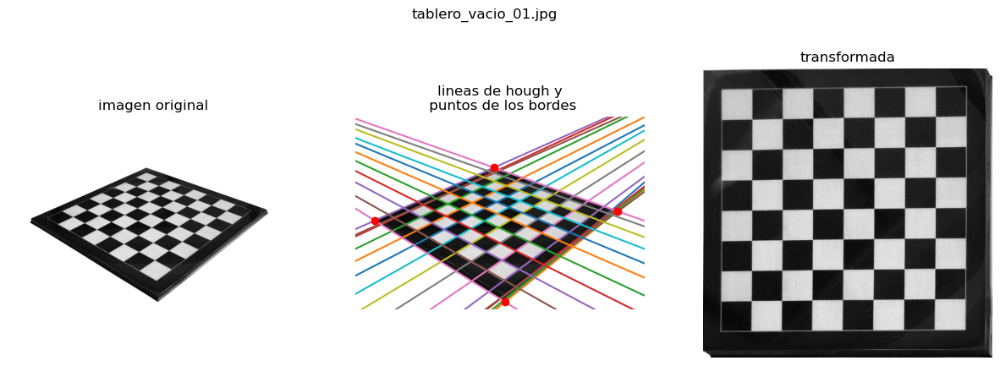

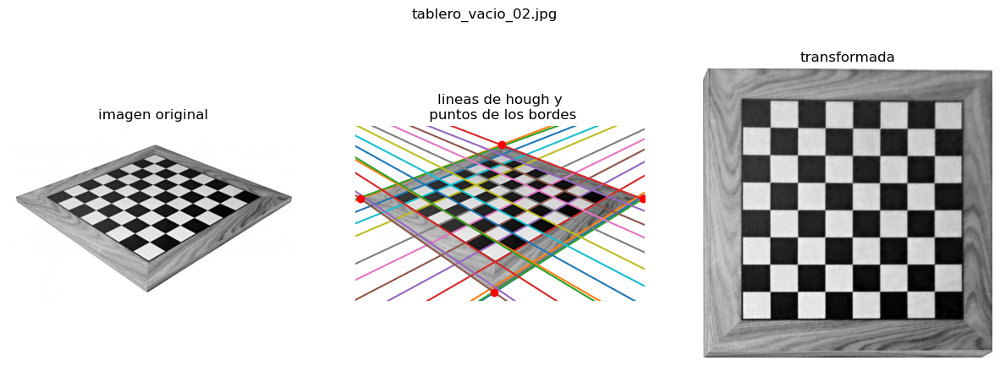

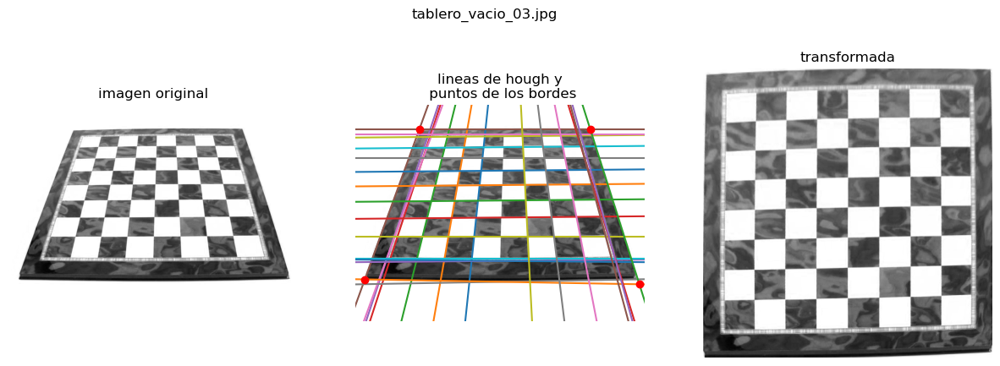

In [10]:
tableros = os.listdir('imagenes/tableros')
    
minimo_canny = [190,  70,  140,  70, 130, 150]
maximo_canny = [240,  150, 210, 150, 220, 220]
minimo_votos = [650, 1200, 400, 650, 300, 320]

for i, tablero in enumerate(tableros):
    # print(tablero)
    I = imread(f'imagenes/tableros/{tablero}')
    if I.ndim>2:
        I = I[:,:,0]
    
    bordes = cv2.Canny(I, minimo_canny[i], maximo_canny[i])
    
    alto, ancho = I.shape
    dist_max = int(((np.sqrt(alto**2 + ancho**2)))) //2
    
    A, L = lineas_hough(bordes, m=360, n=400, minimo_votos=minimo_votos[i])
    puntos = determinar_lineas_exteriores(L,I)
    transformada = transformar_tablero(puntos, I, 500)

    fig, ax = plt.subplots(1, 3, figsize=(15,5))
    
    ax[0].imshow(I, cmap='gray')
    
    plot_lineas_hough(ax[1], L, I)
    ax[1].plot(puntos[0][0], puntos[0][1], 'ro')
    ax[1].plot(puntos[1][0], puntos[1][1], 'ro')
    ax[1].plot(puntos[2][0], puntos[2][1], 'ro')
    ax[1].plot(puntos[3][0], puntos[3][1], 'ro')
    ax[1].imshow(I, cmap='gray')
    
    ax[2].imshow(transformada, cmap='gray')

    titles = ["imagen original", "lineas de hough y\n puntos de los bordes", "transformada"]
    for i, a in enumerate(ax.ravel()):
        a.set_title(titles[i])
        a.axis("off")
    
    plt.suptitle(tablero)
    plt.show()

Se probaron muchas combinaciones con las dimensiones del espacio de los paramteros, el minimo de votos y con el MinVal y MaxVal de la funcion Canny que detecta los bordes, se terminó con los que aparecen en la celda. 

Era muy dificil detectar todas las lineas pertenecientes al tablero, pero considerando que las lineas bordes son las mas notorias y que en la mayoria de los casos se reconocian correctamente, se optó por buscar los parametros que permitieran reconocer las lineas exteriores, intersectarlas y de esa manera ubicar las puntas del tablero. Luego se utilizó la funcion transformar para llevar estos extremos a un cuadrado ya que el tablero visto desde arriba tiene esa forma. Los resultados fueron muy buenos.

## Regiones  

### 6. Implementar el etiquetado de regiones de una imagen binaria

In [15]:
def crear_equivalencia(B, C, equivalencias):
    for i, equivalencia in enumerate(equivalencias):
        if B in equivalencia and C not in equivalencia:
            equivalencias[i].append(C)
            return equivalencias
        elif C in equivalencia and B not in equivalencia:
            equivalencias[i].append(B)
            return equivalencias
        elif C in equivalencia and B in equivalencia:
            # no tengo que agregar ninguna nueva
            return equivalencias
            
    # Si ninguna de las condiciones anteriores se cumple, creo una nueva equivalencia
    equivalencias.append([B, C])
    return equivalencias

    
def quitar_redundancias(equivalencias):
    coinciden = [] 
    for i, equivalencia in enumerate(equivalencias):
        for numero in equivalencia:
            for j, equivalencia2 in enumerate(equivalencias):
                if (i!=j) and (numero in equivalencia2):
                    ya_la_guarde = False
                    for x, y in coinciden:
                        if (i == x and j == y) or (i == y and j == x):
                            ya_la_guarde = True
                            break
                        
                    if not ya_la_guarde:
                        coinciden.append([i,j])
                
    coinciden.sort(key=lambda x: x[1], reverse=True)
    for coincidencia in coinciden:
        i = coincidencia[0]
        j = coincidencia[1]
        equivalencias[i].extend(equivalencias[j]) 
        del equivalencias[j]
            
    return equivalencias
                    
    

def etiquetar(I, conectividad=8):
                     
    alto, ancho = I.shape
    I_out = np.zeros((alto+1, ancho+1))
    equivalencias = []
    n_label = 1
    
    # el pixel [h,w] en la imagen I corresponde al [h+1,w+1] en la imagen I_out para solucionar problemas de borde, dsp los descarto y quedan del mismo tamanio
    for h in range(alto):
        for w in range(ancho):
            A = I_out[h,w]
            B = I_out[h+1,w]
            C = I_out[h,w+1]
            M = I[h,w]
            
            if conectividad==8:
                if (M==0):
                    if(A>0): salida = A
                        
                    elif(B>0 and C==0): salida = B
                    
                    elif(B==0 and C>0): salida = C
                    
                    elif(B>0 and C>0): 
                        salida = C
                        if(B!=C):
                            equivalencias = crear_equivalencia(B, C, equivalencias)
                    
                    else:
                        salida = n_label
                        n_label +=1
                    
                    I_out[h+1,w+1] = salida
                    
                else:
                    if(B>0 and C>0 and B!=C):
                        equivalencias = crear_equivalencia(B, C, equivalencias)
            
            elif conectividad==4:
                if (M==0):                
                    if(B>0 and C==0): salida = B

                    elif(B==0 and C>0): salida = C
                    
                    elif(B>0 and C>0): 
                        salida = C
                        if(B!=C):
                            equivalencias = crear_equivalencia(B, C, equivalencias)
                    
                    else:
                        salida = n_label
                        n_label +=1
                    
                    I_out[h+1,w+1] = salida
                    
                        
    # elimino la columna y fila de sobra que habia puesto por las condiciones de borde
    I_out = I_out[1:, 1:]
    
    equivalencias = quitar_redundancias(equivalencias)
    
    for equivalencia in equivalencias:
        reemplazante = equivalencia[0]
        for i in range(1, len(equivalencia)):
            reemplazado = equivalencia[i]
            aux = (I_out==reemplazado)
            I_out[aux] = reemplazante
    
    
    return I_out

#### Verificar el correcto funcionamiento con la imagen “para_etiquetar.bmp” (tiene 4 regiones negras con conectividad 8 vecinos sobre fondo blanco).

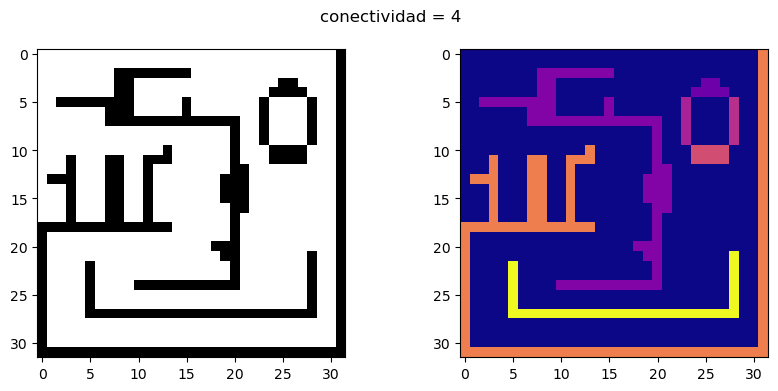

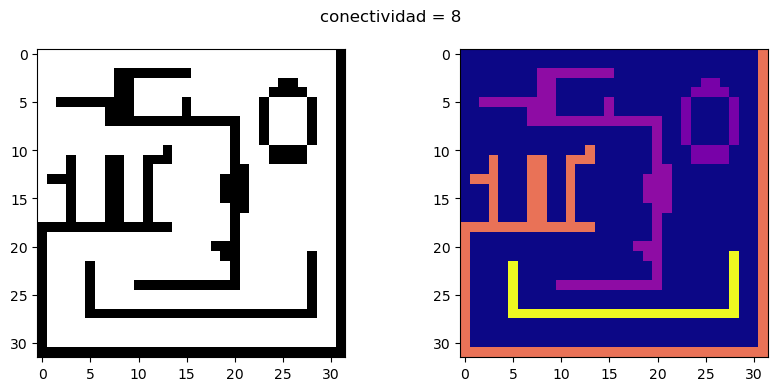

In [28]:
%matplotlib inline
I = imread(f'imagenes/para_etiquetar.bmp')
if I.ndim>2:
    I = I[:,:,0]
I_binaria = (I>125).astype(int)

for conectividad in [4,8]:
    
    etiquetada = etiquetar(I, conectividad=conectividad)

    fig, ax = plt.subplots(1, 2, figsize=(10,4))
    ax[0].imshow(I, cmap='gray')
    ax[1].imshow(etiquetada , cmap='plasma')
    fig.suptitle(f'conectividad = {conectividad}' )
    plt.show()
    
# "nipy_spectral", "plasma", "inferno", "magma" 

Se verifica que la funcion etiquetar funciona correctamente.

#### Aplicación: Para las imágenes globulos_01 y globulos_02
a) Preprocesar en caso de ser necesario con un filtrado adecuado en frecuencia   
b) Umbralizar  
c) Aplicar operaciones morfológicas adecuadas    
d) Etiquetar    
e) Devolver una imagen con las regiones identificadas y una lista de las regiones con sus propiedades (centroide, area, perímetro, circularidad)   


In [28]:
import pandas as pd
def extraer_propiedades(I):
    min = np.min(I).astype(int)
    max = np.max(I).astype(int)
    
    ret = {}
    
    for i in range(min+1, max+1):
        if (I==i).any():
            sumax = np.sum(np.where(I == i)[1])
            sumay = np.sum(np.where(I == i)[0])
            area = np.sum(I == i)
            # Find contours
            contours, hierarchy = cv2.findContours((I == i).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            cnt = contours[0]
            
            perimetro = cv2.arcLength(cnt, True)
            circularidad = 4 * np.pi * area / (perimetro**2)
            
            if area>0:
                # si hay al menos un punto con el valor i, creo en el diccionario a devolver una key i en el diccionario a devolver
                # cuyo valor es un diccionario con los valores del centroide en  x e y
                ret[i]= {'centroidex' : sumax/area, 'centroidey' : sumay/area, 'area': area, 'perimetro':perimetro, 'circularidad': circularidad}
                

    df = pd.DataFrame.from_dict(ret, orient='index', columns=['centroidex', 'centroidey', 'area', 'perimetro', 'circularidad'])
    
    # calculo la info relevante
    cantidad_etiquetas = len(df)
    promedio_area = np.mean(df['area'])
    promedio_perimetro = np.mean(df['perimetro'])
    promedio_circularidad = np.mean(df['circularidad'])

    info = f"""Cantidad de etiquetas: {cantidad_etiquetas}\nPromedio de area: {round(promedio_area, 3)}\nPromedio de perímetro: {round(promedio_perimetro,3)}\nPromedio de circularidad: {round(promedio_circularidad,3)}"""
    
    return df, info


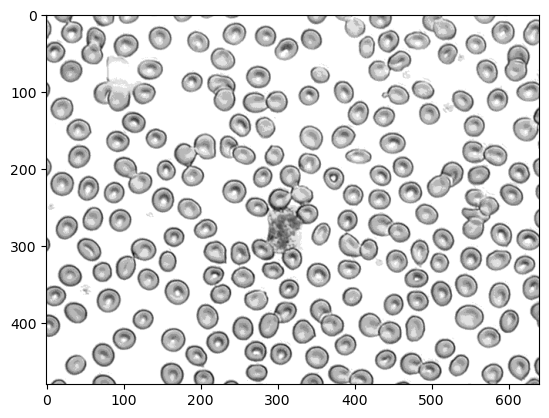

In [63]:

im = cv2.imread(f'imagenes/globulos_01.png')
im_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

plt.imshow(im_gray, cmap='gray')

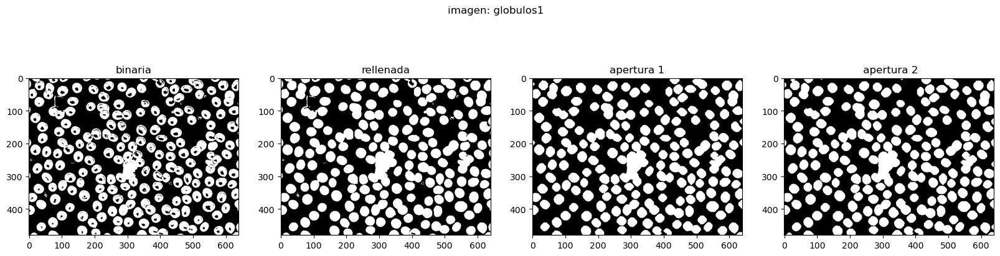

In [67]:
equalized = cv2.equalizeHist(im_gray)

_ , binaria = cv2.threshold(im_gray, 220, 255, cv2.THRESH_BINARY_INV)

rellenada = binary_fill_holes(binaria)

nucleo = getStructuringElement(cv2.MORPH_ELLIPSE , (3,3))

nucleo2 =       np.array([[0, 0, 1, 0, 0],

                          [0, 1, 1, 1, 0],

                          [1, 1, 1, 1, 1],

                          [0, 1, 1, 1, 0],

                          [0, 0, 1, 0, 0]], dtype=np.uint8)



erosionada = erode(rellenada.astype(float), kernel = nucleo, iterations = 7)
dilatada = dilate(erosionada, kernel = nucleo, iterations = 7)

erosionada2 = erode(rellenada.astype(float), kernel = nucleo2, iterations = 3)
dilatada2 = dilate(erosionada2, kernel = nucleo2, iterations = 3)

# se plotea todo
fig, ax = plt.subplots(1, 4, figsize=(20,5))
ax[0].imshow(binaria, cmap='gray'), ax[0].set_title('binaria')
ax[1].imshow(rellenada, cmap='gray'), ax[1].set_title('rellenada')
ax[2].imshow(dilatada, cmap='gray'), ax[2].set_title('apertura 1')
ax[3].imshow(dilatada2, cmap='gray'), ax[3].set_title(' apertura 2')

fig.suptitle(f'imagen: globulos1')
plt.show()


C:\Users\juanm\AppData\Local\Temp\ipykernel_9616\4253779301.py:18: RuntimeWarning: divide by zero encountered in double_scalars
  circularidad = 4 * np.pi * area / (perimetro**2)


conectividad = 4, image = umbralizada y rellenada
Cantidad de etiquetas: 221
Promedio de area: 610.552
Promedio de perímetro: 86.95
Promedio de circularidad: inf


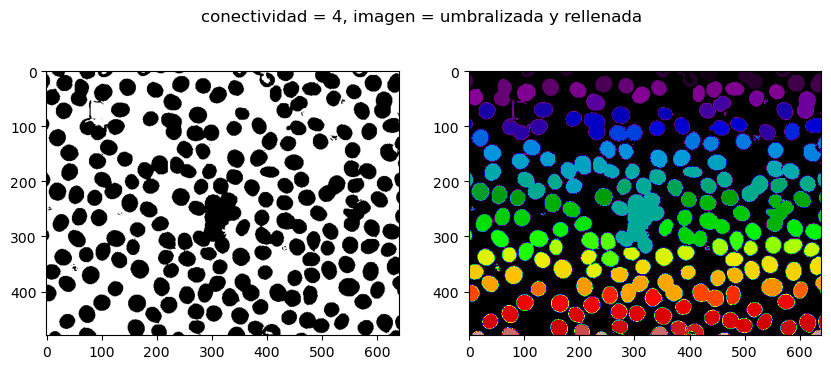

conectividad = 4, image = apertura 1
Cantidad de etiquetas: 170
Promedio de area: 742.653
Promedio de perímetro: 101.512
Promedio de circularidad: 0.901


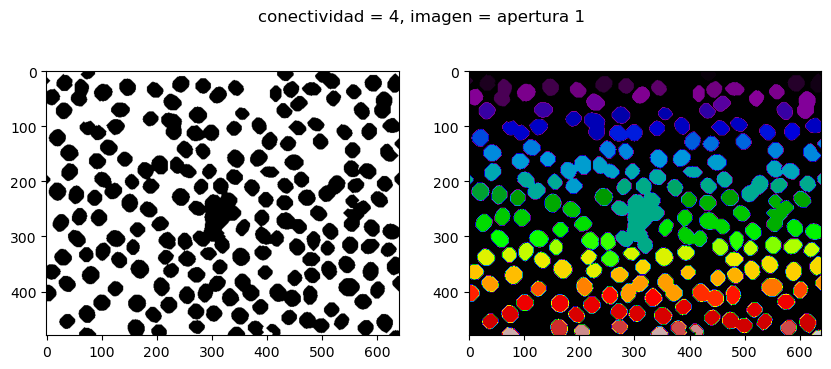

conectividad = 4, image = apertura 2
Cantidad de etiquetas: 175
Promedio de area: 734.709
Promedio de perímetro: 100.811
Promedio de circularidad: 0.891


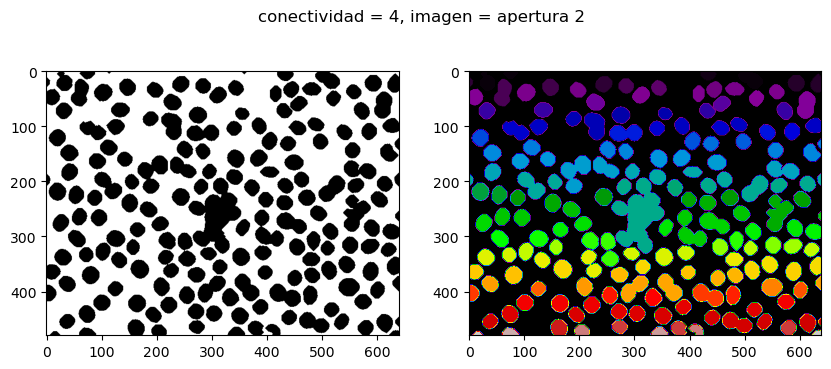

C:\Users\juanm\AppData\Local\Temp\ipykernel_9616\4253779301.py:18: RuntimeWarning: divide by zero encountered in double_scalars
  circularidad = 4 * np.pi * area / (perimetro**2)


conectividad = 8, image = umbralizada y rellenada
Cantidad de etiquetas: 212
Promedio de area: 636.472
Promedio de perímetro: 91.921
Promedio de circularidad: inf


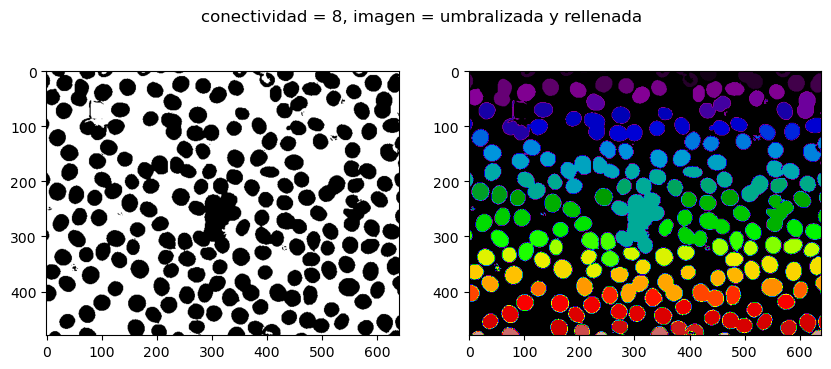

conectividad = 8, image = apertura 1
Cantidad de etiquetas: 170
Promedio de area: 742.653
Promedio de perímetro: 101.512
Promedio de circularidad: 0.901


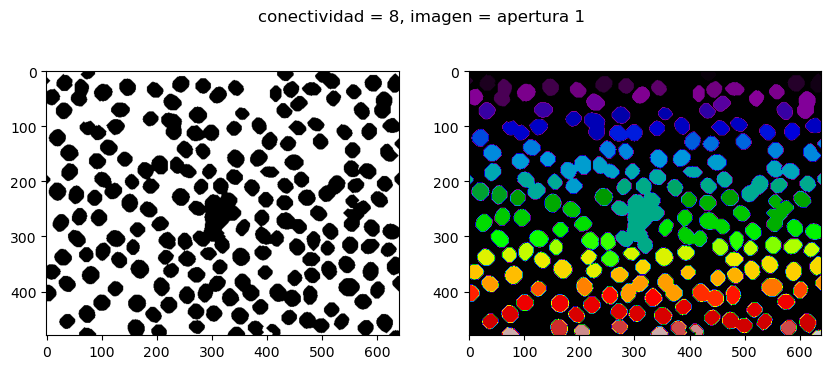

conectividad = 8, image = apertura 2
Cantidad de etiquetas: 175
Promedio de area: 734.709
Promedio de perímetro: 100.811
Promedio de circularidad: 0.891


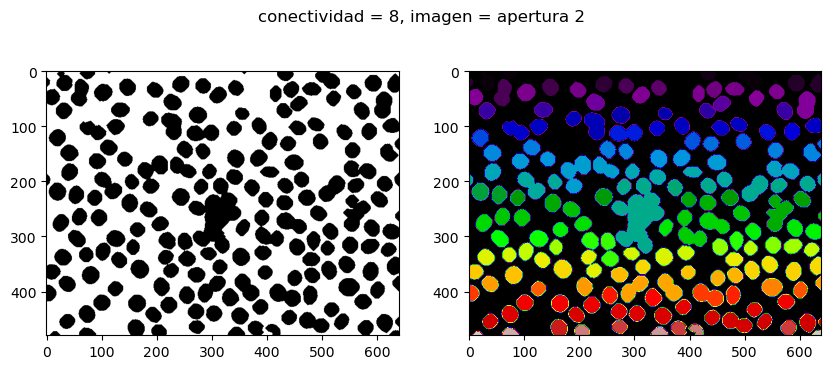

In [68]:
imagenes =  ['umbralizada y rellenada', 'apertura 1', 'apertura 2']
for conectividad in [4,8]:
    
    for i, imagen in enumerate([rellenada, dilatada, dilatada2]):
        para_etiquetar = (imagen<1).astype(int)
        
        etiquetada = etiquetar(para_etiquetar, conectividad=conectividad)
        
        ret, info = extraer_propiedades(etiquetada)
        
        fig, ax = plt.subplots(1, 2, figsize=(10,4))
        ax[0].imshow(para_etiquetar, cmap='gray')
        ax[1].imshow(etiquetada , cmap='nipy_spectral')
        
        print(f'conectividad = {conectividad}, image = {imagenes[i]}')
        print(info)
        
        fig.suptitle(f'conectividad = {conectividad}, imagen = {imagenes[i]}' )
        plt.show()
    

No hay diferencia significativa entre usar conectividad igual a 4 o a 8. 

Ademas, verifico no solo visual sino numericamente que la apertura realizada me elimina los pequeños puntos que habian sobrevivido a la umbralización y al fillbinaryholes, dejando unicamente las celulas que son lo que me interesa (y algunas cosas mas grandes que no se pueden eliminar), esto se puede ver en como disminuye la cantidad de etiquetas y como aumentan el área y el perímetro en las imagenes a la que se les realizó la apertura en comparación a la que solo se umbralizó y rellenó. 

En cuanto a los filtros para la erosion y la dilatacion, no hay casi diferencia entre los dos filtros implementados.

Globulos 1:

Cantidad de etiquetas: 170
Promedio de area: 742.653
Promedio de perímetro: 101.512
Promedio de circularidad: 0.901


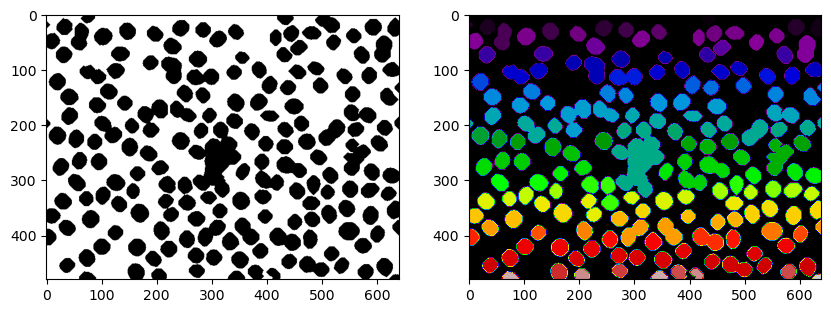

ejemplo del dataframe que  se retorna:
    centroidex  centroidey  area   perimetro  circularidad
5    76.140673    7.012232   327   67.941126      0.890209
6   511.163386   16.157480  1016  124.610172      0.822236
8   433.159236    8.239915   471   80.769553      0.907268
22  630.256228   24.419929   562   89.840620      0.874985
23   33.259484   22.945372   659   93.396970      0.949357
31  592.829235   23.318306   732   97.154329      0.974533
37    2.187500   19.000000    64   33.798990      0.704016
39  244.023843   25.085554   713   95.740115      0.977488
58  147.349794   30.751715   729   97.154329      0.970539
60  284.481605   28.379599   598   86.911689      0.994843


In [69]:
print('Globulos 1:\n')

para_etiquetar = (dilatada<1).astype(int)

etiquetada = etiquetar(para_etiquetar, conectividad=4)

ret, info = extraer_propiedades(etiquetada)

fig, ax = plt.subplots(1, 2, figsize=(10,4))
ax[0].imshow(para_etiquetar, cmap='gray')
ax[1].imshow(etiquetada , cmap='nipy_spectral')

print(info)

plt.show()

print('ejemplo del dataframe que  se retorna:')
print(ret.head(10))

In [70]:
def filtro_pasa_alto(im_frec, sigma, cte=1):
    alto, ancho = im_frec.shape
    
    filtro = np.zeros_like(im_frec)
    for h in range(alto):
        for w in range(ancho):
            exponente =  np.sqrt((h-(alto/2))**2 + (w-(ancho/2))**2) 
            valor = 1 - np.exp(-exponente/ (sigma**2))/cte
            filtro[h,w] = valor
    
    filtro  = fftshift(filtro)
    filtrada_f = im_frec * filtro
    filtrada = np.abs(ifft2(filtrada_f))   
    
    return filtro, filtrada, filtrada_f

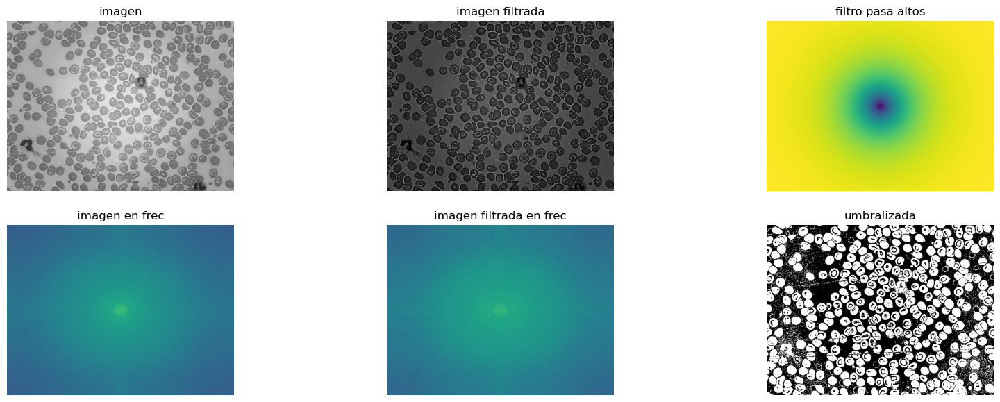

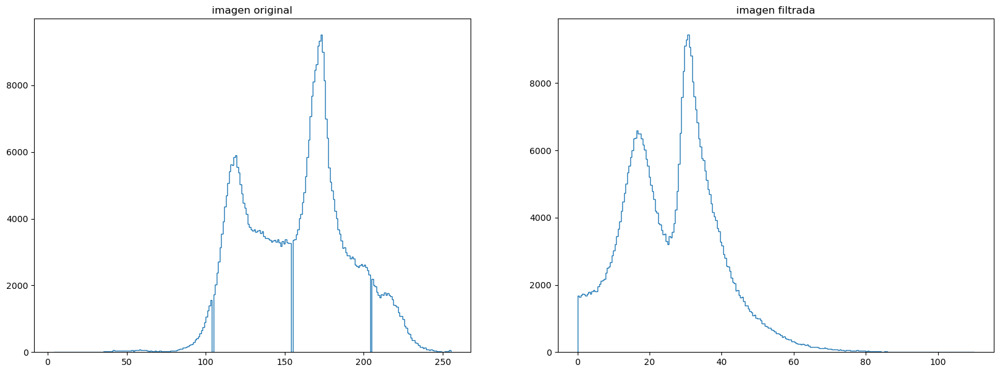

In [71]:
# se carga la imagen
im = cv2.imread(f'imagenes/globulos_02.png')
im_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

im_f = fft2(im_gray)
filtro, filtrada, im2_f = filtro_pasa_alto(im_f, 10, 1.2)
_ , binaria = cv2.threshold(filtrada, 28, 255, cv2.THRESH_BINARY_INV)


# se plotea todo
fig, ax = plt.subplots(2, 3, figsize=(20,7))
ax[0,0].imshow(im_gray, cmap='gray')
ax[0,1].imshow(filtrada, cmap='gray')
ax[0,2].imshow(np.log10(1 + np.abs(fftshift(filtro))))
ax[1,0].imshow(np.log10(1 + np.abs(fftshift(im_f))))
ax[1,1].imshow(np.log10(1 + np.abs(fftshift(im2_f))))
ax[1,2].imshow(binaria, cmap='gray')

titles = ["imagen", "imagen filtrada","filtro pasa altos",  "imagen en frec", "imagen filtrada en frec", "umbralizada"]
for i, a in enumerate(ax.ravel()):
    a.set_title(titles[i])
    a.axis("off")
    

plt.show()

fig, ax = plt.subplots(1, 2, figsize=(20,7))
counts, bin_edges = np.histogram(im_gray, 256)
ax[0].stairs(counts, bin_edges), ax[0].set_title(f'imagen original')

counts, bin_edges = np.histogram(filtrada, 256)
ax[1].stairs(counts, bin_edges), ax[1].set_title(f'imagen filtrada')
plt.show()

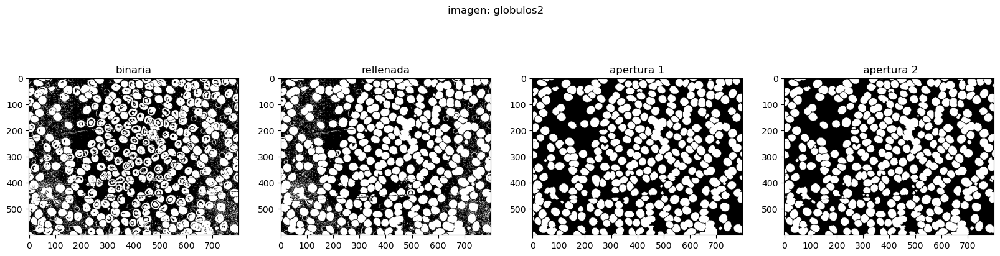

In [77]:

rellenada = binary_fill_holes(binaria)


nucleo = getStructuringElement( cv2.MORPH_ELLIPSE , (3,3))

nucleo2 =       np.array([[0, 0, 1, 0, 0],

                          [0, 1, 1, 1, 0],

                          [1, 1, 1, 1, 1],

                          [0, 1, 1, 1, 0],

                          [0, 0, 1, 0, 0]], dtype=np.uint8)



erosionada = erode(rellenada.astype(float), kernel = nucleo ,iterations = 5)
dilatada = dilate( erosionada , kernel = nucleo ,iterations = 5)

erosionada2 = erode(rellenada.astype(float), kernel = nucleo2 ,iterations = 2)
dilatada2 = dilate( erosionada2 , kernel = nucleo2 ,iterations = 2)

# se plotea todo
fig, ax = plt.subplots(1, 4, figsize=(20,5))
ax[0].imshow(binaria, cmap='gray'), ax[0].set_title('binaria')
ax[1].imshow(rellenada, cmap='gray'), ax[1].set_title('rellenada')
ax[2].imshow(dilatada, cmap='gray'), ax[2].set_title('apertura 1')
ax[3].imshow(dilatada2, cmap='gray'), ax[3].set_title(' apertura 2')

    

    
fig.suptitle(f'imagen: globulos2')
plt.show()

Globulos 2:

Cantidad de etiquetas: 291
Promedio de area: 813.763
Promedio de perímetro: 106.549
Promedio de circularidad: 0.933


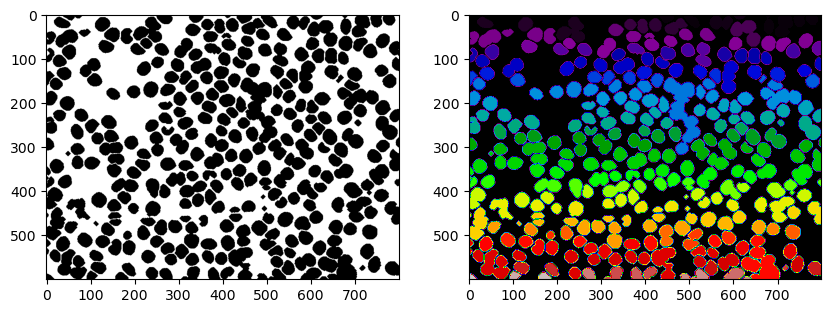

ejemplo del dataframe que  se retorna:
    centroidex  centroidey  area   perimetro  circularidad
1    58.756579    4.804825   456  114.083260      0.440282
11  268.805430    9.877828   663   97.840620      0.870332
12  339.357834    8.373308   517   86.426406      0.869776
13  412.783019    3.443396   106   41.455844      0.775076
14  448.962233    8.619048   609   96.769552      0.817240
15  505.773856   15.367320   765  112.468036      0.759999
16  678.803398   24.953883   824  134.367530      0.573520
20  748.257267   13.678779   688   98.769552      0.886242
21  776.912252   11.743377   604   89.012193      0.957961
25  713.210187   26.295293  1551  172.752307      0.653091


In [78]:
print('Globulos 2:\n')

para_etiquetar = (dilatada<1).astype(int)

etiquetada = etiquetar(para_etiquetar, conectividad=4)

ret, info = extraer_propiedades(etiquetada)

fig, ax = plt.subplots(1, 2, figsize=(10,4))
ax[0].imshow(para_etiquetar, cmap='gray')
ax[1].imshow(etiquetada , cmap='nipy_spectral')

# print(f'conectividad = {conectividad}, imagen={imagenes[i]}')

print(info)

# fig.suptitle(f'conectividad = {conectividad}, imagen={imagenes[i]}' )
plt.show()

print('ejemplo del dataframe que  se retorna:')
print(ret.head(10))


Para esta imagen habia una dificultad extra y es que habia un cambio en la iluminación, lo que resultaba en que el centro de la imagen fuera mas claro y no fuera posible umbralizar separando a las particulas del fondo sin realizar un preprocesamiento. El problema de iluminación en cuestión correspondía a un cambio lento de los valores de la imagen que en frecuencia corresponde a los valores mas bajos, mientras que el cambio entre una particula y el fondo corresponde a frecuencias mas altas ya que ahi hay un borde bien definido. Por esta razon se dicidió implementar un filtro pasaalto que permitiera solucionar esto, y asi poder umbralizar de tal manera que no se perdieran particulas en alguna zona de la imagen confundiendolas con el fondo